
# Sebastian Velez Puerta
# Juan Diego Zapata
---



In [ ]:
# Importando las bibliotecas necesarias
import os          # Para interactuar con el sistema operativo
import shutil      # Para operaciones avanzadas de manipulación de archivos y directorios
import cv2         # OpenCV, una biblioteca popular para procesamiento de imágenes
import random      # Para la generación de números aleatorios
import matplotlib.pyplot as plt  # Para visualización de datos y gráficos
import numpy as np  # Para operaciones numéricas eficientes en matrices
import copy        # Para realizar copias profundas de objetos


In [ ]:
# Instalación de Ultralytics
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 646.6/646.6 kB 11.8 MB/s eta 0:00:00


In [ ]:
# Instalación de la biblioteca wandb usando pip
!pip install wandb

# Importación de la biblioteca wandb
import wandb

# Clave de API
api_key = "6488c7305a5a964a4f762815a527a45959189642"

# Iniciar sesión en Wandb usando la clave de API proporcionada
wandb.login(key=api_key)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.8/252.8 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.3 MB/s eta 0:00:00


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
from ultralytics import YOLO  # Importa la clase YOLO desde el módulo ultralytics


In [ ]:
# Importa la clase 'drive' del módulo 'google.colab'
from google.colab import drive

# Monta el sistema de archivos de Google Drive en el entorno de Colab
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import zipfile
import os

# Ruta del archivo en Google Drive
drive_path = '/content/drive/MyDrive/african-wild-life.zip'

# Ruta de destino para descomprimir
extract_path = "/content/african-wildlife"

# Descomprimir el archivo
with zipfile.ZipFile(drive_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Listar el contenido del directorio
os.listdir(extract_path)


['zebra', 'buffalo', 'rhino', 'elephant']

In [ ]:
# Definiendo el tamaño estándar de la imagen para YOLO v8
image_size = 640


In [ ]:
# Creando rutas para imágenes y etiquetas por separado

# Obteniendo la ruta actual del directorio de trabajo
curr_path = os.getcwd()

# Definiendo rutas para conjuntos de entrenamiento, validación y prueba para imágenes
imgtrainpath = os.path.join(curr_path, 'images', 'train')
imgvalpath = os.path.join(curr_path, 'images', 'validation')
imgtestpath = os.path.join(curr_path, 'images', 'test')

# Definiendo rutas para conjuntos de entrenamiento, validación y prueba para etiquetas
labeltrainpath = os.path.join(curr_path, 'labels', 'train')
labelvalpath = os.path.join(curr_path, 'labels', 'validation')
labeltestpath = os.path.join(curr_path, 'labels', 'test')

# Creando directorios para todas las rutas definidas
os.makedirs(imgtrainpath)   # Directorio para imágenes de entrenamiento
os.makedirs(imgvalpath)     # Directorio para imágenes de validación
os.makedirs(imgtestpath)    # Directorio para imágenes de prueba
os.makedirs(labeltrainpath) # Directorio para etiquetas de entrenamiento
os.makedirs(labelvalpath)   # Directorio para etiquetas de validación
os.makedirs(labeltestpath)  # Directorio para etiquetas de prueba


In [ ]:
# Iterando a través de los directorios y archivos en la ruta 'extract_path'
for dirname in os.listdir(extract_path):
    # Construyendo la ruta completa del directorio actual
    dirpath = os.path.join(extract_path, dirname)

    # Iterando a través de los archivos en el directorio actual
    for file in os.listdir(dirpath):
        # Construyendo la ruta completa del archivo actual
        filepath = os.path.join(dirpath, file)

        # Creando un nuevo nombre combinando el nombre del directorio y el nombre del archivo
        newname = dirname + '_' + file

        # Verificando si el archivo es una etiqueta (.txt)
        if file.endswith((".txt")):
            # Copiando la etiqueta al directorio de etiquetas de entrenamiento
            shutil.copy(filepath, labeltrainpath)

            # Construyendo las rutas nuevas y antiguas para la etiqueta
            path = os.path.join(labeltrainpath, file)
            newpath = os.path.join(labeltrainpath, newname)

        # Verificando si el archivo es una imagen (.jpg o .JPG)
        elif file.endswith((".jpg", ".JPG")):
            # Redimensionando la imagen y guardándola en el directorio de imágenes de entrenamiento
            img_resized = cv2.resize(cv2.imread(filepath), (image_size, image_size))
            path = os.path.join(imgtrainpath, file)
            cv2.imwrite(path, img_resized)

            # Construyendo las rutas nuevas y antiguas para la imagen
            newpath = os.path.join(imgtrainpath, newname)

        # Renombrando el archivo (etiqueta o imagen)
        os.rename(path, newpath)


In [ ]:
# Verificando el número de archivos de imágenes y etiquetas para todas las clases en el conjunto de entrenamiento

# Obteniendo la cantidad de archivos en el directorio de imágenes de entrenamiento
num_img_train_files = len(os.listdir(imgtrainpath))

# Obteniendo la cantidad de archivos en el directorio de etiquetas de entrenamiento
num_label_train_files = len(os.listdir(labeltrainpath))

# Devolviendo los resultados como una tupla (número de archivos de imágenes, número de archivos de etiquetas)
num_img_train_files, num_label_train_files


(1504, 1504)

In [ ]:
# Función para verificar si todos los elementos en la lista son iguales
def are_all_elements_same(lst):
    # Si la lista está vacía, se considera que todos los elementos son iguales.
    if not lst:
        return True

    # Obteniendo el primer elemento de la lista
    first_element = lst[0]

    # Iterando sobre los elementos restantes de la lista
    for element in lst[1:]:
        # Si se encuentra un elemento diferente al primer elemento, la lista no tiene todos los elementos iguales
        if element != first_element:
            return False

    # Si no se encontraron elementos diferentes, todos los elementos son iguales
    return True


In [ ]:
# Iterando sobre los archivos en el directorio de etiquetas de entrenamiento
for file in os.listdir(labeltrainpath):
    # Creando una lista para almacenar las clases presentes en la etiqueta
    classes_list = []

    # Abriendo el archivo de etiqueta y extrayendo las clases
    with open(os.path.join(labeltrainpath, file), "r") as f:
        for line in f:
            # Extrayendo la clase de cada línea y añadiéndola a la lista de clases
            class_id, _, _, _, _ = line.strip().split(" ")
            classes_list.append(class_id)

    # Verificando si hay diferentes tipos de animales presentes en la imagen
    if not are_all_elements_same(classes_list):
        # Construyendo las rutas para la etiqueta y la imagen
        filepath = os.path.join(labeltrainpath, file)
        newpath = os.path.join(labeltestpath, file)

        # Moviendo el archivo de etiqueta al directorio de prueba
        shutil.move(filepath, newpath)

        # Extrayendo el nombre del archivo sin extensión
        basename = os.path.splitext(file)[0]

        # Imprimiendo el nombre de la imagen
        print(basename)

        # Construyendo las rutas para la imagen antigua y la nueva
        imgfilename = basename + '.jpg'
        oldimgfilepath = os.path.join(imgtrainpath, imgfilename)
        newimgfilepath = os.path.join(imgtestpath, imgfilename)

        # Moviendo la imagen al directorio de prueba
        shutil.move(oldimgfilepath, newimgfilepath)


elephant_288
elephant_345
zebra_073
buffalo_273
buffalo_300
elephant_290
elephant_166
zebra_338
rhino_238
rhino_256
buffalo_299
elephant_291
buffalo_291
buffalo_297
buffalo_301
buffalo_298
zebra_339
rhino_375


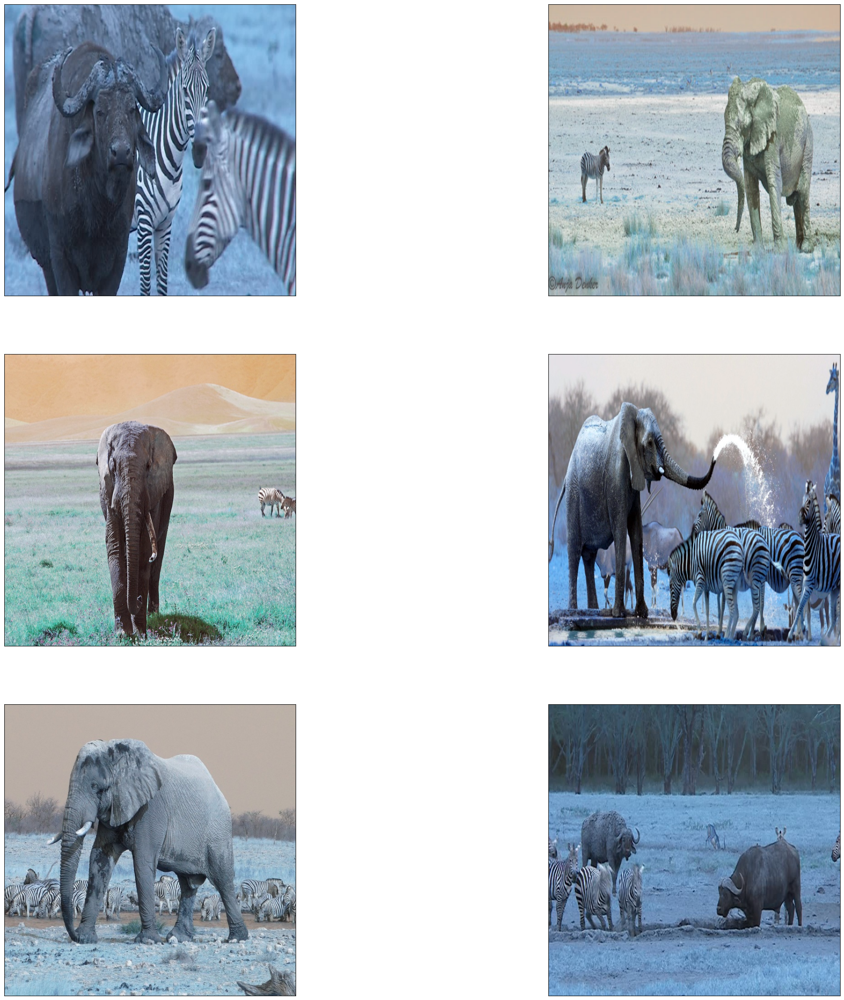

In [ ]:
# Creando una figura de matplotlib con un tamaño de 30x30 pulgadas
plt.figure(figsize=(30, 30))

# Iterando sobre las primeras 6 imágenes en el directorio de imágenes de prueba
for i in range(6):
    # Construyendo la ruta de la imagen de prueba
    test_image = os.path.join(imgtestpath, os.listdir(imgtestpath)[i])

    # Creando un eje (subplot) en la figura
    ax = plt.subplot(3, 2, i + 1)

    # Mostrando la imagen actual en el subplot
    plt.imshow(cv2.imread(test_image))

    # Eliminando los marcadores del eje en los ejes x e y
    plt.xticks([])
    plt.yticks([])


In [ ]:
# Verificando el tamaño del conjunto de prueba

# Obteniendo el número de archivos en el directorio de imágenes de prueba
num_img_test_files = len(os.listdir(imgtestpath))

# Obteniendo el número de archivos en el directorio de etiquetas de prueba
num_label_test_files = len(os.listdir(labeltestpath))

# Devolviendo los resultados como una tupla (número de archivos de imágenes en prueba, número de archivos de etiquetas en prueba)
num_img_test_files, num_label_test_files


(18, 18)

In [ ]:
# Verificando el tamaño del conjunto de entrenamiento (+ validación)

# Obteniendo el número de archivos en el directorio de imágenes de entrenamiento
num_img_train_files = len(os.listdir(imgtrainpath))

# Obteniendo el número de archivos en el directorio de etiquetas de entrenamiento
num_label_train_files = len(os.listdir(labeltrainpath))

# Devolviendo los resultados como una tupla (número de archivos de imágenes en entrenamiento, número de archivos de etiquetas en entrenamiento)
num_img_train_files, num_label_train_files


(1486, 1486)

In [ ]:
# Moviendo el 20% de los datos a un conjunto de validación

# Factor que representa el porcentaje de datos a mover (en este caso, 20%)
factor = 0.2

# Iterando sobre una muestra aleatoria del 20% de imágenes en el directorio de entrenamiento
for file in random.sample(os.listdir(imgtrainpath), int(len(os.listdir(imgtrainpath)) * factor)):
    # Extrayendo el nombre del archivo sin extensión
    basename = os.path.splitext(file)[0]

    # Construyendo las rutas de archivos de etiquetas (txt) y las rutas de destino tanto para etiquetas como para imágenes
    textfilename = basename + '.txt'
    labelfilepath = os.path.join(labeltrainpath, textfilename)
    labeldestpath = os.path.join(labelvalpath, textfilename)
    imgfilepath = os.path.join(imgtrainpath, file)
    imgdestpath = os.path.join(imgvalpath, file)

    # Moviendo la imagen y la etiqueta al directorio de validación
    shutil.move(imgfilepath, imgdestpath)
    shutil.move(labelfilepath, labeldestpath)


In [ ]:
# Verificando el tamaño del conjunto de entrenamiento

# Obteniendo el número de archivos en el directorio de imágenes de entrenamiento
num_img_train_files = len(os.listdir(imgtrainpath))

# Obteniendo el número de archivos en el directorio de etiquetas de entrenamiento
num_label_train_files = len(os.listdir(labeltrainpath))

# Devolviendo los resultados como una tupla (número de archivos de imágenes en entrenamiento, número de archivos de etiquetas en entrenamiento)
num_img_train_files, num_label_train_files


(1189, 1189)

In [ ]:
# Verificando el tamaño del conjunto de validación

# Obteniendo el número de archivos en el directorio de imágenes de validación
num_img_val_files = len(os.listdir(imgvalpath))

# Obteniendo el número de archivos en el directorio de etiquetas de validación
num_label_val_files = len(os.listdir(labelvalpath))

# Devolviendo los resultados como una tupla (número de archivos de imágenes en validación, número de archivos de etiquetas en validación)
num_img_val_files, num_label_val_files


(297, 297)

In [ ]:
# Función para obtener las coordenadas del cuadro delimitador desde archivos de etiquetas de texto
def get_bbox_from_label(text_file_path):
    # Lista para almacenar las coordenadas del cuadro delimitador
    bbox_list = []

    # Abriendo el archivo de etiqueta de texto y extrayendo las coordenadas
    with open(text_file_path, "r") as file:
        for line in file:
            # Extrayendo la clase, coordenadas del centro, ancho y alto de cada línea
            class_id, x_centre, y_centre, width, height = line.strip().split(" ")

            # Calculando las coordenadas del cuadro delimitador en función de las coordenadas del centro, ancho y alto
            x1 = (float(x_centre) + (float(width) / 2)) * image_size
            x0 = (float(x_centre) - (float(width) / 2)) * image_size
            y1 = (float(y_centre) + (float(height) / 2)) * image_size
            y0 = (float(y_centre) - (float(height) / 2)) * image_size

            # Creando un array de vértices que representan el cuadro delimitador
            vertices = np.array([[int(x0), int(y0)], [int(x1), int(y0)],
                                 [int(x1), int(y1)], [int(x0), int(y1)]])

            # Añadiendo las coordenadas del cuadro delimitador a la lista
            bbox_list.append(vertices)

    # Devolviendo la lista de coordenadas del cuadro delimitador como una tupla
    return tuple(bbox_list)


In [ ]:
# Definiendo el color rojo en formato RGB para dibujar un cuadro delimitador
red = (255, 0, 0)


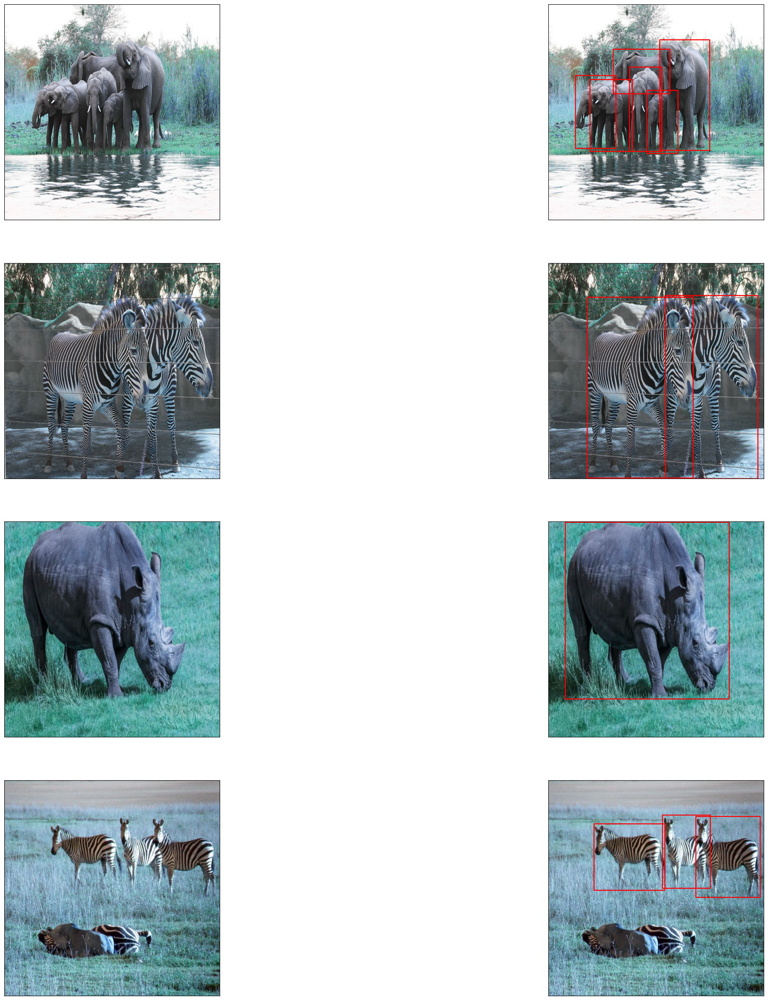

In [ ]:
# Dibujando cuadros delimitadores para imágenes aleatorias en datos de entrenamiento
plt.figure(figsize=(30, 30))

# Iterando sobre índices pares en el rango (1, 8, 2)
for i in range(1, 8, 2):
    # Seleccionando un índice aleatorio de imágenes en el directorio de entrenamiento
    k = random.randint(0, len(os.listdir(imgtrainpath)) - 1)

    # Construyendo las rutas de la imagen y la etiqueta correspondientes al índice seleccionado
    img_path = os.path.join(imgtrainpath, sorted(os.listdir(imgtrainpath))[k])
    label_path = os.path.join(labeltrainpath, sorted(os.listdir(labeltrainpath))[k])

    # Extrayendo las coordenadas del cuadro delimitador
    bbox = get_bbox_from_label(label_path)

    # Leyendo la imagen
    image = cv2.imread(img_path)

    # Creando una copia profunda de la imagen
    image_copy = copy.deepcopy(image)

    # Dibujando el cuadro delimitador en la copia de la imagen
    cv2.drawContours(image_copy, bbox, -1, red, 2)

    # Creando un subplot para mostrar la imagen original
    ax = plt.subplot(4, 2, i)
    plt.imshow(image)  # mostrando la imagen
    plt.xticks([])
    plt.yticks([])

    # Creando un subplot para mostrar la imagen con el cuadro delimitador
    ax = plt.subplot(4, 2, i + 1)
    plt.imshow(image_copy)  # mostrando la imagen con el cuadro delimitador
    plt.xticks([])
    plt.yticks([])


In [ ]:
# Definiendo la variable newline para el archivo de configuración
newline = '\n'


In [ ]:
# Comenzando con un comentario en el archivo de configuración
ln_1 = '# Train/val/test sets' + newline

# Declaración de las rutas de entrenamiento, validación y prueba
ln_2 = 'train: ' + "'" + imgtrainpath + "'" + newline
ln_3 = 'val: ' + "'" + imgvalpath + "'" + newline
ln_4 = 'test: ' + "'" + imgtestpath + "'" + newline
ln_5 = newline
ln_6 = '# Classes' + newline

# Declaración de los nombres de las clases
ln_7 = 'names:' + newline
ln_8 = '  0: buffalo' + newline
ln_9 = '  1: elephant' + newline
ln_10 = '  2: rhino' + newline
ln_11 = '  3: zebra'

# Lista que contiene las líneas de configuración
config_lines = [ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8, ln_9, ln_10, ln_11]


In [ ]:
# Creando la ruta para el archivo de configuración
config_path = os.path.join(curr_path, 'config.yaml')

# Devolviendo la ruta del archivo de configuración
config_path


'/content/config.yaml'

In [ ]:
# Escribiendo el archivo de configuración
with open(config_path, 'w') as f:
    f.writelines(config_lines)


In [ ]:
# Utilizando la arquitectura y los pesos preentrenados del modelo YOLO para el entrenamiento
model = YOLO('yolov8m.yaml').load('yolov8m.pt')



                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

100%|██████████| 49.7M/49.7M [00:00<00:00, 283MB/s]


Transferred 475/475 items from pretrained weights


In [ ]:
# Entrenando el modelo
results = model.train(data=config_path, epochs=100, iou=0.5, conf=0.01)

Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/config.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=0.01, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscri

100%|██████████| 755k/755k [00:00<00:00, 104MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

wandb: Currently logged in as: svelezpu (velez-pa). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 311MB/s]


AMP: checks passed ✅


train: Scanning /content/labels/train... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<00:00, 1623.44it/s]

train: New cache created: /content/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/labels/validation... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<00:00, 935.89it/s]

val: New cache created: /content/labels/validation.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.88G     0.8886      1.664      1.327         20        640: 100%|██████████| 75/75 [00:48<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.65it/s]

                   all        297        515      0.505      0.511      0.484      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.24G      1.123      1.527      1.513         10        640: 100%|██████████| 75/75 [00:42<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]

                   all        297        515      0.199      0.375      0.186     0.0747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.25G      1.202      1.577      1.558         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]

                   all        297        515       0.46      0.535      0.442      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.27G      1.249      1.595      1.588         17        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        297        515      0.585       0.54      0.499      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      7.25G      1.199      1.536      1.533         18        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.68it/s]

                   all        297        515      0.582       0.24      0.317      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      7.19G       1.14      1.445      1.515         17        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.68it/s]

                   all        297        515      0.567      0.546      0.549      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      7.25G      1.134      1.384      1.501         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        297        515      0.723      0.655      0.719      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.25G      1.088      1.323      1.472         13        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.64it/s]

                   all        297        515      0.718      0.648      0.743      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.25G      1.071      1.283      1.457         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.51it/s]

                   all        297        515      0.788      0.766      0.823      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.18G      1.023      1.206      1.405         22        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        297        515      0.688      0.631      0.713      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.24G      1.011      1.158      1.397         22        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]

                   all        297        515      0.845      0.712      0.822      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      7.24G      0.976      1.151      1.387         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.54it/s]

                   all        297        515      0.858      0.764      0.849      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.28G     0.9601        1.1       1.37         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]


                   all        297        515      0.836      0.797      0.858       0.63

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.19G     0.9498      1.061      1.347         11        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]

                   all        297        515      0.897      0.759      0.871      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.27G     0.9307      1.063      1.349         19        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

                   all        297        515      0.851      0.818      0.889      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.08G     0.9378      1.025      1.334          9        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.57it/s]

                   all        297        515      0.862      0.831      0.889      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.22G      0.916     0.9872      1.331         20        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]

                   all        297        515      0.918      0.804      0.916      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.21G     0.8833     0.9843       1.31         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        297        515      0.898      0.822      0.907      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.25G     0.8856     0.9689      1.313         24        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.65it/s]

                   all        297        515      0.875      0.824      0.917      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.26G     0.8622     0.9493      1.298         21        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]

                   all        297        515      0.864      0.825      0.897        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.22G       0.86     0.8987      1.303         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        297        515      0.944      0.859      0.949      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.21G     0.8668     0.9189      1.289         22        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.66it/s]

                   all        297        515      0.896      0.814        0.9      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.24G      0.861     0.8826      1.297         17        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        297        515      0.919      0.845       0.93      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.25G     0.8122     0.8607      1.265         18        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        297        515      0.879      0.837      0.914      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.25G     0.8334     0.8548      1.274         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.57it/s]

                   all        297        515      0.921      0.831      0.922      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.22G     0.8325     0.8639      1.271         20        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]

                   all        297        515      0.896       0.88      0.938      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.22G     0.8376     0.8558      1.286         18        640: 100%|██████████| 75/75 [00:42<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        297        515      0.928      0.835      0.924      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.25G     0.8053     0.8438      1.268         22        640: 100%|██████████| 75/75 [00:42<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]


                   all        297        515      0.921      0.858       0.94      0.732

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.25G     0.7987     0.8105      1.245         28        640: 100%|██████████| 75/75 [00:42<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]

                   all        297        515      0.916      0.866      0.934      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.21G     0.7821     0.7893       1.24         26        640: 100%|██████████| 75/75 [00:42<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        297        515      0.922      0.866      0.937       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      7.26G     0.7955     0.7847      1.241         20        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        297        515      0.853      0.855      0.918      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.24G     0.7784     0.7926      1.227         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]


                   all        297        515      0.892      0.869      0.942       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.28G     0.7607     0.7784      1.229         11        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.70it/s]

                   all        297        515       0.92      0.848      0.928      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.23G     0.7724     0.7726      1.232         14        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.60it/s]

                   all        297        515      0.898       0.86      0.942      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.23G     0.7701     0.7572      1.219         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.10it/s]

                   all        297        515      0.881      0.865       0.92      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.22G     0.7302     0.7334      1.203         18        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]

                   all        297        515      0.926      0.852      0.938      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.24G     0.7475     0.7222      1.222         12        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]

                   all        297        515       0.95      0.847      0.949      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.21G     0.7584     0.7438       1.22         11        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        297        515       0.94      0.875      0.941      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.24G     0.7328     0.7339      1.209         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        297        515      0.916      0.873      0.941      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.22G     0.7264      0.707      1.199         22        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]


                   all        297        515      0.908      0.891      0.942      0.763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.23G     0.7368      0.689      1.194         12        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.81it/s]

                   all        297        515      0.948      0.861       0.94      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.23G     0.7176     0.6893       1.19         17        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        297        515      0.912      0.879      0.943       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.25G     0.6956     0.6771      1.187         11        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        297        515      0.963      0.885      0.947      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.26G     0.7144     0.6895      1.199         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        297        515      0.936      0.881      0.946      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.24G       0.68     0.6366      1.163         22        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.58it/s]

                   all        297        515      0.947      0.861      0.946      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       7.2G     0.7015     0.6469      1.182         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        297        515      0.921      0.898      0.953      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.25G     0.7061     0.6528      1.177         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.58it/s]

                   all        297        515      0.943      0.859      0.945      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.22G      0.696     0.6816      1.187         18        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.75it/s]

                   all        297        515      0.902      0.922      0.953      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.25G     0.6543     0.6057      1.148         23        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]

                   all        297        515      0.914      0.921      0.959      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.19G     0.6873     0.6359       1.18         20        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.57it/s]

                   all        297        515      0.925      0.872       0.95      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.24G     0.6719     0.6224      1.164         11        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]

                   all        297        515      0.905      0.884      0.944      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.26G     0.6725     0.6167      1.158         15        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.10it/s]

                   all        297        515      0.954       0.87      0.952      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.24G       0.66      0.612      1.157         20        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.52it/s]

                   all        297        515      0.966      0.878      0.956      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.22G     0.6506      0.589      1.159         13        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.70it/s]

                   all        297        515      0.938      0.899      0.957      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.25G     0.6415      0.581      1.139         15        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.79it/s]

                   all        297        515      0.938      0.882      0.953      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.26G     0.6448     0.5806      1.149         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

                   all        297        515      0.883      0.916      0.952      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.25G     0.6346     0.5849      1.137         18        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.52it/s]

                   all        297        515      0.919      0.912      0.952      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.21G     0.6499     0.5767      1.141         21        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        297        515      0.912      0.912       0.96      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.24G     0.6288     0.5669      1.129         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        297        515      0.934      0.902      0.955        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       7.2G     0.6458     0.5936      1.153         23        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.72it/s]

                   all        297        515      0.929      0.908      0.961      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.25G     0.6363     0.5663      1.142         31        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]

                   all        297        515      0.932      0.899      0.954      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.21G     0.6293     0.5746      1.126         23        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.12it/s]

                   all        297        515      0.932      0.898      0.952      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.24G     0.6313      0.571      1.138         16        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.67it/s]

                   all        297        515      0.943      0.905      0.958      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.24G     0.6222     0.5611      1.142         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]

                   all        297        515      0.931      0.899      0.955       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.24G     0.6197     0.5628      1.126         19        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        297        515      0.952      0.899      0.954      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       7.2G     0.5936     0.5347        1.1         19        640: 100%|██████████| 75/75 [00:42<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.56it/s]

                   all        297        515      0.941      0.896      0.957      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.25G      0.608     0.5546      1.118         28        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        297        515      0.945      0.896      0.958       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.24G     0.6048     0.5315      1.122         23        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        297        515      0.915      0.929       0.96      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.24G     0.6026     0.5374      1.116         30        640: 100%|██████████| 75/75 [00:42<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]

                   all        297        515      0.946      0.898      0.959      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.24G     0.5947     0.5261      1.108         21        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.75it/s]

                   all        297        515      0.951      0.868      0.955      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.24G     0.5857     0.5302      1.104         17        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        297        515      0.945      0.907      0.958      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.26G      0.577     0.4959      1.095         16        640: 100%|██████████| 75/75 [00:42<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.60it/s]

                   all        297        515      0.901      0.926      0.954      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.25G     0.5775     0.4974      1.089         21        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        297        515      0.934       0.93      0.965      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.24G     0.5812     0.5066      1.111         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]

                   all        297        515      0.949      0.909      0.963      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.24G     0.5661     0.4846      1.087         17        640: 100%|██████████| 75/75 [00:41<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        297        515      0.943      0.906      0.955       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.22G     0.5605     0.4888      1.086         23        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.56it/s]

                   all        297        515      0.915      0.924      0.961      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.24G     0.5666     0.5049      1.099         19        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        297        515      0.953      0.897      0.965      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       7.2G     0.5679     0.4852      1.099         22        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        297        515       0.96      0.896      0.963      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.24G     0.5565     0.4683      1.087         19        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.49it/s]

                   all        297        515      0.936      0.909      0.961      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.24G     0.5532     0.4779      1.093         12        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        297        515      0.944      0.891      0.954       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.28G     0.5488      0.464      1.084         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]

                   all        297        515      0.959      0.902      0.961      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.21G     0.5398     0.4447      1.078         27        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]

                   all        297        515      0.952      0.918      0.969      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.24G     0.5466      0.462      1.083         19        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        297        515      0.947      0.914      0.966      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.23G     0.5362     0.4632      1.076         20        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        297        515       0.95      0.912      0.963      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      7.24G     0.5473     0.4472      1.072         25        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]

                   all        297        515      0.923      0.932      0.962      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.22G     0.5302      0.463      1.061         19        640: 100%|██████████| 75/75 [00:41<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]

                   all        297        515      0.937      0.897      0.963      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.25G     0.5278     0.4501      1.076         28        640: 100%|██████████| 75/75 [00:41<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]

                   all        297        515      0.939      0.934      0.966      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.23G     0.5297     0.4404      1.068         22        640: 100%|██████████| 75/75 [00:41<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.52it/s]

                   all        297        515      0.949      0.915      0.965      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.22G     0.5357     0.4467      1.081         23        640: 100%|██████████| 75/75 [00:41<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        297        515      0.949       0.92      0.969       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.23G      0.528     0.4378       1.07         14        640: 100%|██████████| 75/75 [00:41<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        297        515       0.95      0.908      0.968      0.835


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.22G     0.3745     0.2744     0.9589          8        640: 100%|██████████| 75/75 [00:42<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.51it/s]

                   all        297        515      0.951      0.911      0.965      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      7.22G     0.3571     0.2481     0.9407          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        297        515      0.953      0.914      0.963       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      7.21G     0.3577     0.2577      0.945          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]

                   all        297        515       0.96      0.895      0.967       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      7.24G     0.3512      0.248     0.9391          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]

                   all        297        515      0.937      0.916      0.963      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       7.2G     0.3451     0.2408     0.9305          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        297        515      0.945      0.914      0.962      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      7.21G     0.3356     0.2335     0.9212          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.54it/s]

                   all        297        515      0.949      0.913      0.966      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      7.22G     0.3347     0.2354     0.9287         11        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]

                   all        297        515      0.956      0.915      0.969       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       7.2G     0.3291     0.2287     0.9221          6        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]

                   all        297        515      0.949      0.922      0.971      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      7.22G     0.3262     0.2259     0.9224          5        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

                   all        297        515      0.957      0.905      0.967      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      7.23G     0.3222     0.2188     0.9185          7        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.70it/s]

                   all        297        515      0.962      0.907       0.97      0.845



100 epochs completed in 1.370 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


                   all        297        515      0.962      0.907       0.97      0.845
               buffalo        297        116      0.932      0.914      0.962      0.867
              elephant        297        136      0.969      0.922      0.969      0.809
                 rhino        297        119          1      0.928      0.991      0.926
                 zebra        297        144      0.947      0.865      0.959       0.78
Speed: 0.4ms preprocess, 10.4ms inference, 0.0ms loss, 5.4ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃████▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▂▁▂▅▆▇▇▇█▇██▇███████████████████████████
metrics/mAP50-95(B),▁▁▂▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███▇███████████████
metrics/precision(B),▂▁▂▅▆▆▇▇█▇▇▇▆▇▇▇██▇▇▇█▇█████▇███████████
metrics/recall(B),▁▁▂▃▄▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇▇█▇▇▇▇▇██▇█████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▆██▇▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▁▁▁▁


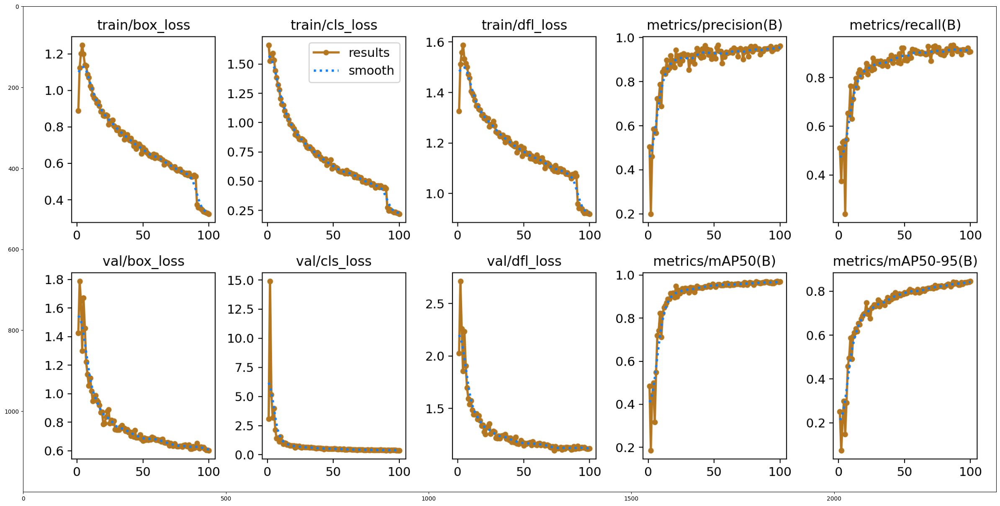

In [ ]:
# Creando una figura de matplotlib con un tamaño específico
plt.figure(figsize=(30, 30))

# Construyendo la ruta del directorio de resultados de entrenamiento
trainingresult_path = os.path.join(curr_path, 'runs', 'detect', 'train')

# Leyendo la imagen de resultados desde el archivo 'results.png'
results_png = cv2.imread(os.path.join(trainingresult_path, 'results.png'))

# Mostrando la imagen de resultados en la figura de matplotlib
plt.imshow(results_png)


In [ ]:
# Función para evaluar las métricas del modelo, específicamente mAP@50
def evaluate_map50(trained_model, data_path, dataset='val'):
    # Evaluando las métricas del modelo en el conjunto de datos especificado
    metrics = trained_model.val(data=data_path, split=dataset)

    # Extrayendo el valor de mAP@50 de las métricas
    map50 = round(metrics.box.map50, 3)

    # Imprimiendo el mAP del modelo para todas las imágenes en el conjunto de datos dado
    print("The mAP of the model for all images on {0} dataset is {1}".format(dataset, map50))

    # Devolviendo las métricas y el valor de mAP@50
    return metrics, map50


In [ ]:
# Evaluando las métricas de entrenamiento
train_metrics, train_map50 = evaluate_map50(model, config_path, dataset='train')

Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/labels/train.cache... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]


                   all       1189       2098      0.992      0.992      0.995      0.964
               buffalo       1189        416      0.995          1      0.995      0.974
              elephant       1189        599      0.988      0.997      0.995      0.954
                 rhino       1189        435      0.993      0.991      0.995      0.976
                 zebra       1189        648       0.99      0.981      0.994      0.951
Speed: 0.3ms preprocess, 23.1ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/train2
The mAP of the model for all images on train dataset is 0.995


In [ ]:
# Evaluando las métricas de validación
val_metrics, val_map50 = evaluate_map50(model, config_path, dataset='val')


Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/labels/validation.cache... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:11<00:00,  1.68it/s]


                   all        297        515      0.962      0.907       0.97      0.845
               buffalo        297        116      0.932      0.914      0.962      0.867
              elephant        297        136      0.969      0.922      0.969      0.809
                 rhino        297        119          1      0.928      0.991      0.926
                 zebra        297        144      0.947      0.866      0.958      0.779
Speed: 0.4ms preprocess, 22.0ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/train3
The mAP of the model for all images on val dataset is 0.97


In [ ]:
# Evaluando las métricas en el conjunto de prueba
test_metrics, test_map50 = evaluate_map50(model, config_path, dataset='test')


Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/labels/test... 18 images, 0 backgrounds, 0 corrupt: 100%|██████████| 18/18 [00:00<00:00, 421.09it/s]

val: New cache created: /content/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.25it/s]


                   all         18         72      0.889      0.789       0.89      0.734
               buffalo         18         22      0.892        0.5      0.778      0.647
              elephant         18         13      0.834          1      0.956      0.886
                 rhino         18          5      0.989          1      0.995       0.86
                 zebra         18         32       0.84      0.656      0.833      0.543
Speed: 0.3ms preprocess, 43.7ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train4
The mAP of the model for all images on test dataset is 0.89



image 1/1 /content/images/test/buffalo_298.jpg: 640x640 1 buffalo, 1 zebra, 39.6ms
Speed: 2.7ms preprocess, 39.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/images/test/buffalo_273.jpg: 640x640 4 buffalos, 4 zebras, 37.2ms
Speed: 2.5ms preprocess, 37.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/images/test/buffalo_291.jpg: 640x640 1 buffalo, 3 zebras, 37.2ms
Speed: 1.6ms preprocess, 37.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


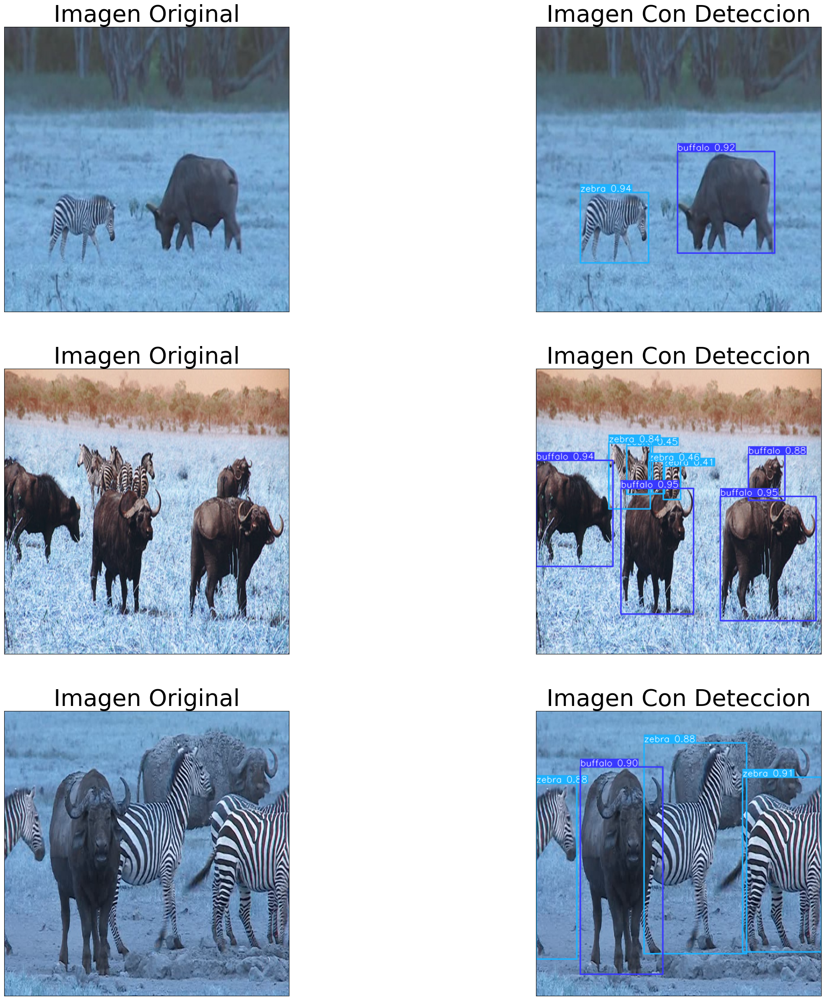

In [ ]:
# Creando una figura de matplotlib con un tamaño específico
plt.figure(figsize=(30, 30))

# Seleccionando un número de imagen aleatorio de las 18 imágenes en el conjunto de prueba
m = random.randint(0, 17)

# Iterando sobre índices impares en el rango (1, 6, 2)
for i in range(1, 6, 2):
    # Construyendo la ruta de la imagen de prueba seleccionada
    test_image = os.path.join(imgtestpath, os.listdir(imgtestpath)[m])

    # Creando un subplot para mostrar la imagen actual
    ax = plt.subplot(3, 2, i)
    plt.imshow(cv2.imread(test_image))  # Mostrando la imagen actual
    plt.xticks([])
    plt.yticks([])
    plt.title("Imagen Original", fontsize=40)  # Agregando un título al subplot

    # Realizando una predicción en la imagen de prueba
    res = model(test_image)
    res_plotted = res[0].plot()

    # Creando un subplot para mostrar la imagen con las predicciones
    ax = plt.subplot(3, 2, i + 1)
    plt.imshow(res_plotted)  # Mostrando la imagen con las predicciones
    plt.title("Imagen Con Deteccion", fontsize=40)  # Agregando un título al subplot
    plt.xticks([])
    plt.yticks([])

    # Incrementando el índice para seleccionar la siguiente imagen aleatoria en el siguiente bucle
    m = m + 1
